# 07_Implementacion_Modelo

!pip install openpyxl

In [2]:
# Instalar paquetes necesarios (ejecutar solo una vez)
!pip install pandas numpy matplotlib statsmodels pmdarima prophet scikit-learn


[notice] A new release of pip is available: 25.0.1 -> 25.1.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [3]:
!pip install seaborn



[notice] A new release of pip is available: 25.0.1 -> 25.1.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [4]:
!pip install pmdarima --upgrade


[notice] A new release of pip is available: 25.0.1 -> 25.1.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [5]:

# Importar biblitecas
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
#from pmdarima import auto_arima
from prophet import Prophet
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error
import warnings
warnings.filterwarnings('ignore')
# Leer el archivo CSV
file_path = '../Data/Input/df_completo.xlsx'  
df_completo = pd.read_excel(file_path)


In [6]:
df_completo.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30073 entries, 0 to 30072
Data columns (total 7 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   Fecha              30073 non-null  datetime64[ns]
 1   Producto           30073 non-null  object        
 2   Precio_Sogamoso    30073 non-null  float64       
 3   Precio_Tunja       30073 non-null  float64       
 4   Precio_Duitama     30073 non-null  float64       
 5   Precio_Bogotá      30073 non-null  float64       
 6   Promedio_Mercados  30073 non-null  float64       
dtypes: datetime64[ns](1), float64(5), object(1)
memory usage: 1.6+ MB


## Prophet

In [7]:
from prophet import Prophet
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

productos = df_completo['Producto'].unique()

# Listas para guardar resultados
resultados = []
graficas = []

# Recorrer productos
for producto in productos:
    try:
        # Filtrar datos del producto
        df_producto = df_completo[df_completo['Producto'] == producto].copy()
        df_producto = df_producto.rename(columns={'Fecha': 'ds', 'Precio_Sogamoso': 'y'})

        columnas = ['ds', 'y', 'Promedio_Mercados']
        if not all(col in df_producto.columns for col in columnas):
            continue

        df_producto = df_producto[columnas].dropna()
        if len(df_producto) < 30:
            continue

        df_producto = df_producto.sort_values('ds').reset_index(drop=True)

        # División 80/20 sin importar fechas
        split_index = int(len(df_producto) * 0.8)
        train = df_producto.iloc[:split_index]
        test = df_producto.iloc[split_index:]

        if len(train) < 20 or len(test) == 0:
            continue

        # Crear modelo Prophet
        model = Prophet(
            changepoint_prior_scale=0.5,
            n_changepoints=40,
            yearly_seasonality=False,
            weekly_seasonality=True,
            daily_seasonality=False
        )

        model.add_regressor('Promedio_Mercados')
        model.fit(train)

        future = test[['ds', 'Promedio_Mercados']]
        forecast = model.predict(future)

        # Evaluación
        y_true = test['y'].values
        y_pred = forecast['yhat'].values
        mae = mean_absolute_error(y_true, y_pred)
        mse = mean_squared_error(y_true, y_pred)
        rmse = np.sqrt(mse)
        r2 = r2_score(y_true, y_pred)

        resultados.append({
            'Producto': producto,
            'MAE': round(mae, 2),
            'MSE': round(mse, 2),
            'RMSE': round(rmse, 2),
            'R2': round(r2, 4),
            'N_datos_train': len(train),
            'N_datos_test': len(test)
        })

        graficas.append({
            'producto': producto,
            'ds': test['ds'],
            'real': test['y'],
            'pred': forecast['yhat'],
            'lower': forecast['yhat_lower'],
            'upper': forecast['yhat_upper']
        })

    except Exception as e:
        print(f"Error con producto {producto}: {e}")

# Mostrar resultados
df_resultados = pd.DataFrame(resultados).sort_values(by='RMSE')
print(df_resultados)


18:14:16 - cmdstanpy - INFO - Chain [1] start processing
18:14:16 - cmdstanpy - INFO - Chain [1] done processing
18:14:17 - cmdstanpy - INFO - Chain [1] start processing
18:14:17 - cmdstanpy - INFO - Chain [1] done processing
18:14:18 - cmdstanpy - INFO - Chain [1] start processing
18:14:18 - cmdstanpy - INFO - Chain [1] done processing
18:14:19 - cmdstanpy - INFO - Chain [1] start processing
18:14:19 - cmdstanpy - INFO - Chain [1] done processing
18:14:19 - cmdstanpy - INFO - Chain [1] start processing
18:14:20 - cmdstanpy - INFO - Chain [1] done processing
18:14:21 - cmdstanpy - INFO - Chain [1] start processing
18:14:21 - cmdstanpy - INFO - Chain [1] done processing
18:14:22 - cmdstanpy - INFO - Chain [1] start processing
18:14:22 - cmdstanpy - INFO - Chain [1] done processing
18:14:22 - cmdstanpy - INFO - Chain [1] start processing
18:14:22 - cmdstanpy - INFO - Chain [1] done processing
18:14:23 - cmdstanpy - INFO - Chain [1] start processing
18:14:23 - cmdstanpy - INFO - Chain [1]

                   Producto      MAE          MSE     RMSE       R2  \
26            Naranja Comun     0.32         0.13     0.36   1.0000   
29           Papaya Maradol    95.76     15142.17   123.05   0.9224   
4              Banano Urabá    97.54     26463.58   162.68   0.5427   
39                Zanahoria   138.66     42409.94   205.94   0.8072   
5   Cebolla Cabezona Blanca   142.32     51919.46   227.86   0.9341   
34                Remolacha   189.20     60843.83   246.67   0.9259   
17             Mango Azucar   229.42     61047.07   247.08   0.5695   
36            Tomate Chonto   208.69     66319.13   257.53   0.9301   
15                     Lulo   215.88     67591.18   259.98   0.8471   
16                Mandarina   213.59     71775.56   267.91   0.9586   
24                    Melon   211.73     71864.57   268.08   0.7391   
14             Limon Tahití   216.22     82858.93   287.85   0.9529   
28      Papa Criolla Limpia   192.32     84235.23   290.23   0.9142   
38    

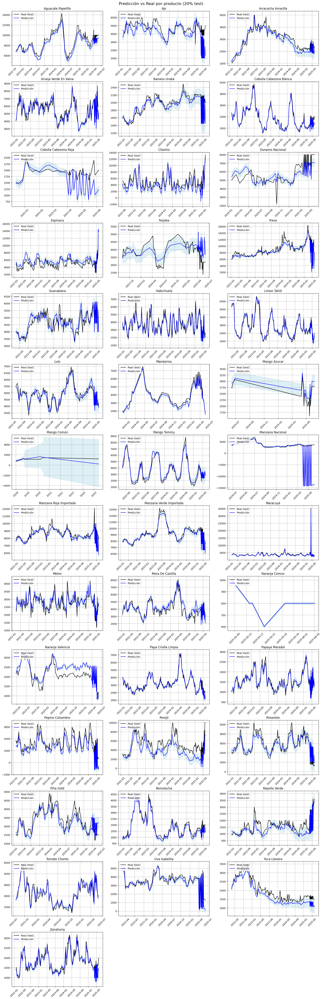

In [8]:
# ----------- GRAFICAR PREDICCIONES (solo test) -----------
n = len(graficas)
cols = 3
rows = (n + cols - 1) // cols

fig, axes = plt.subplots(rows, cols, figsize=(cols * 6, rows * 4), constrained_layout=True)
axes = axes.flatten()

for i, graf in enumerate(graficas):
    ax = axes[i]

    # Graficar solo el 20% de test
    ax.plot(graf['ds'], graf['real'], label='Real (test)', color='black')
    ax.plot(graf['ds'], graf['pred'], label='Predicción', color='blue')
    ax.fill_between(graf['ds'], graf['lower'], graf['upper'], color='lightblue', alpha=0.4)

    ax.set_title(graf['producto'])
    ax.tick_params(axis='x', rotation=45)
    ax.grid(True)
    ax.legend(loc='upper left')

# Eliminar ejes vacíos si hay
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

fig.suptitle('Predicción vs Real por producto (20% test)', fontsize=16)
plt.show()


### Con todos los mercados

In [9]:
df_completo.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30073 entries, 0 to 30072
Data columns (total 7 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   Fecha              30073 non-null  datetime64[ns]
 1   Producto           30073 non-null  object        
 2   Precio_Sogamoso    30073 non-null  float64       
 3   Precio_Tunja       30073 non-null  float64       
 4   Precio_Duitama     30073 non-null  float64       
 5   Precio_Bogotá      30073 non-null  float64       
 6   Promedio_Mercados  30073 non-null  float64       
dtypes: datetime64[ns](1), float64(5), object(1)
memory usage: 1.6+ MB


In [10]:
from prophet import Prophet
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

productos = df_completo['Producto'].unique()

resultados = []
graficas = []

for producto in productos:
    try:
        # Filtrar y preparar datos
        df_producto = df_completo[df_completo['Producto'] == producto].copy()
        df_producto = df_producto.rename(columns={'Fecha': 'ds', 'Precio_Sogamoso': 'y'})

        columnas = ['ds', 'y', 'Precio_Duitama', 'Precio_Tunja', 'Precio_Bogotá', 'Promedio_Mercados']
        if not all(col in df_producto.columns for col in columnas):
            continue

        df_producto = df_producto[columnas].dropna()
        if len(df_producto) < 30:
            continue

        df_producto = df_producto.sort_values('ds').reset_index(drop=True)

        # División 80/20
        split_index = int(len(df_producto) * 0.8)
        train = df_producto.iloc[:split_index]
        test = df_producto.iloc[split_index:]

        if len(train) < 20 or len(test) == 0:
            continue

        # Modelo Prophet
        model = Prophet(
            changepoint_prior_scale=0.5,
            n_changepoints=40,
            yearly_seasonality=False,
            weekly_seasonality=True,
            daily_seasonality=False
        )

        # Agregar regresores
        model.add_regressor('Precio_Duitama')
        model.add_regressor('Precio_Tunja')
        model.add_regressor('Precio_Bogotá')
        model.add_regressor('Promedio_Mercados')

        # Entrenamiento
        model.fit(train)

        # Preparar futuro (debe incluir todos los regresores)
        future = test[['ds', 'Precio_Duitama', 'Precio_Tunja', 'Precio_Bogotá', 'Promedio_Mercados']]
        forecast = model.predict(future)

        # Evaluación
        y_true = test['y'].values
        y_pred = forecast['yhat'].values
        mae = mean_absolute_error(y_true, y_pred)
        mse = mean_squared_error(y_true, y_pred)
        rmse = np.sqrt(mse)
        r2 = r2_score(y_true, y_pred)

        resultados.append({
            'Producto': producto,
            'MAE': round(mae, 2),
            'MSE': round(mse, 2),
            'RMSE': round(rmse, 2),
            'R2': round(r2, 4),
            'N_datos_train': len(train),
            'N_datos_test': len(test)
        })

        graficas.append({
            'producto': producto,
            'ds': test['ds'],
            'real': test['y'],
            'pred': forecast['yhat'],
            'lower': forecast['yhat_lower'],
            'upper': forecast['yhat_upper']
        })

    except Exception as e:
        print(f"Error con producto {producto}: {e}")

# Resultados ordenados por RMSE
df_resultados = pd.DataFrame(resultados).sort_values(by='RMSE')
print(df_resultados)


18:15:28 - cmdstanpy - INFO - Chain [1] start processing
18:15:32 - cmdstanpy - INFO - Chain [1] done processing
18:15:32 - cmdstanpy - INFO - Chain [1] start processing
18:15:35 - cmdstanpy - INFO - Chain [1] done processing
18:15:35 - cmdstanpy - INFO - Chain [1] start processing
18:15:38 - cmdstanpy - INFO - Chain [1] done processing
18:15:38 - cmdstanpy - INFO - Chain [1] start processing
18:15:40 - cmdstanpy - INFO - Chain [1] done processing
18:15:41 - cmdstanpy - INFO - Chain [1] start processing
18:15:43 - cmdstanpy - INFO - Chain [1] done processing
18:15:43 - cmdstanpy - INFO - Chain [1] start processing
18:15:46 - cmdstanpy - INFO - Chain [1] done processing
18:15:46 - cmdstanpy - INFO - Chain [1] start processing
18:15:46 - cmdstanpy - INFO - Chain [1] done processing
18:15:47 - cmdstanpy - INFO - Chain [1] start processing
18:15:48 - cmdstanpy - INFO - Chain [1] done processing
18:15:49 - cmdstanpy - INFO - Chain [1] start processing
18:15:50 - cmdstanpy - INFO - Chain [1]

                   Producto      MAE           MSE      RMSE         R2  \
26            Naranja Comun     0.02  0.000000e+00      0.02     1.0000   
35            Repollo Verde     1.58  3.780000e+01      6.15     0.9999   
38             Yuca Llanera     4.42  2.778300e+02     16.67     0.9992   
37            Uva Isabelita     8.60  5.238300e+02     22.89     0.9994   
0        Aguacate Papelillo    19.08  3.973310e+03     63.03     0.9989   
29           Papaya Maradol    19.22  5.029450e+03     70.92     0.9742   
30          Pepino Cohombro    25.30  9.907820e+03     99.54     0.9793   
34                Remolacha    29.37  1.233904e+04    111.08     0.9850   
24                    Melon    30.81  1.328241e+04    115.25     0.9518   
4              Banano Urabá    31.39  1.424203e+04    119.34     0.7539   
36            Tomate Chonto    50.08  1.523948e+04    123.45     0.9839   
39                Zanahoria    33.58  1.738451e+04    131.85     0.9210   
31                  Perej

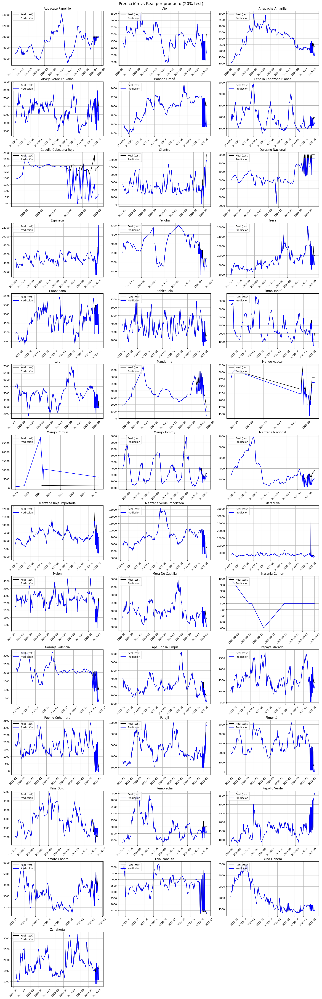

In [11]:
# ----------- GRAFICAR PREDICCIONES (solo test) -----------
n = len(graficas)
cols = 3
rows = (n + cols - 1) // cols

fig, axes = plt.subplots(rows, cols, figsize=(cols * 6, rows * 4), constrained_layout=True)
axes = axes.flatten()

for i, graf in enumerate(graficas):
    ax = axes[i]

    # Graficar solo el 20% de test
    ax.plot(graf['ds'], graf['real'], label='Real (test)', color='black')
    ax.plot(graf['ds'], graf['pred'], label='Predicción', color='blue')
    ax.fill_between(graf['ds'], graf['lower'], graf['upper'], color='lightblue', alpha=0.4)

    ax.set_title(graf['producto'])
    ax.tick_params(axis='x', rotation=45)
    ax.grid(True)
    ax.legend(loc='upper left')

# Eliminar ejes vacíos si hay
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

fig.suptitle('Predicción vs Real por producto (20% test)', fontsize=16)
plt.show()


In [12]:
df_resultados.head(100)

,Producto,MAE,MSE,RMSE,R2,N_datos_train,N_datos_test
26,Naranja Comun,0.02,0.000000e+00,0.02,1.0000,28,7
35,Repollo Verde,1.58,3.780000e+01,6.15,0.9999,739,185
38,Yuca Llanera,4.42,2.778300e+02,16.67,0.9992,714,179
37,Uva Isabelita,8.60,5.238300e+02,22.89,0.9994,516,129
0,Aguacate Papelillo,19.08,3.973310e+03,63.03,0.9989,577,145
29,Papaya Maradol,19.22,5.029450e+03,70.92,0.9742,711,178
30,Pepino Cohombro,25.30,9.907820e+03,99.54,0.9793,742,186
34,Remolacha,29.37,1.233904e+04,111.08,0.9850,740,186
24,Melon,30.81,1.328241e+04,115.25,0.9518,728,182
4,Banano Urabá,31.39,1.424203e+04,119.34,0.7539,748,188


## XGBoost

In [13]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from xgboost import XGBRegressor
from sklearn.model_selection import GridSearchCV
from datetime import timedelta

# Suponiendo que df_completo ya está cargado y contiene todos los productos
productos = df_completo['Producto'].unique()

# Listas para guardar resultados
resultados = []
graficas = []
mejores_parametros = {}

# Espacio de búsqueda para GridSearch
param_grid = {
    'n_estimators': [50, 100],
    'max_depth': [2, 3, 4],
    'learning_rate': [0.01, 0.1, 0.2]
}

# Recorrer productos
for producto in productos:
    try:
        # Filtrar datos del producto
        df_producto = df_completo[df_completo['Producto'] == producto].copy()
        df_producto = df_producto.rename(columns={'Fecha': 'ds', 'Precio_Sogamoso': 'y'})

        columnas = ['ds', 'y', 'Promedio_Mercados']
        if not all(col in df_producto.columns for col in columnas):
            continue

        df_producto = df_producto[columnas].dropna()
        if len(df_producto) < 30:
            continue

        df_producto = df_producto.sort_values('ds')

        # Dividir entre train y test: últimos 2 meses
        ultima_fecha = df_producto['ds'].max()
        fecha_inicio_test = ultima_fecha - pd.DateOffset(months=2)

        test = df_producto[df_producto['ds'] >= fecha_inicio_test]
        train = df_producto[df_producto['ds'] < fecha_inicio_test]

        if len(train) < 20 or len(test) == 0:
            continue

        X_train = train[['Promedio_Mercados']]
        y_train = train['y']
        X_test = test[['Promedio_Mercados']]
        y_test = test['y']

        # Grid Search para encontrar mejores hiperparámetros
        grid_search = GridSearchCV(
            estimator=XGBRegressor(random_state=42, verbosity=0),
            param_grid=param_grid,
            scoring='neg_mean_squared_error',
            cv=3,
            n_jobs=-1
        )
        grid_search.fit(X_train, y_train)
        best_model = grid_search.best_estimator_

        # Guardar mejores parámetros
        mejores_parametros[producto] = grid_search.best_params_

        # Predecir
        y_pred = best_model.predict(X_test)

        # Evaluar
        mae = mean_absolute_error(y_test, y_pred)
        mse = mean_squared_error(y_test, y_pred)
        rmse = np.sqrt(mse)
        r2 = r2_score(y_test, y_pred)

        resultados.append({
            'Producto': producto,
            'MAE': round(mae, 2),
            'MSE': round(mse, 2),
            'RMSE': round(rmse, 2),
            'R2': round(r2, 4),
            'N_datos_train': len(train),
            'N_datos_test': len(test)
        })

        graficas.append({
            'producto': producto,
            'ds': test['ds'],
            'real': y_test,
            'pred': y_pred
        })

    except Exception as e:
        print(f"Error con producto {producto}: {e}")

# Mostrar resultados
df_resultados = pd.DataFrame(resultados).sort_values(by='R2')
print(df_resultados)




                   Producto      MAE          MSE     RMSE      R2  \
1                       Ajo  1018.51   1267385.70  1125.78 -8.4036   
32                Piña Gold   269.74     97193.51   311.76 -0.9842   
37             Yuca Llanera    91.79     10770.68   103.78 -0.5892   
10                  Feijoba   494.75    285190.99   534.03 -0.4232   
2        Arracacha Amarilla   269.99     77979.56   279.25 -0.2699   
20         Manzana Nacional   219.91     55032.08   234.59 -0.1113   
12                Guanabana   170.17     54519.57   233.49 -0.0608   
23                 Maracuyá  1281.98  34907487.31  5908.26  0.1063   
11                    Fresa   838.24    962765.80   981.21  0.1976   
0        Aguacate Papelillo   406.24    188427.43   434.08  0.2223   
15                     Lulo   207.99     61847.23   248.69  0.3426   
9                  Espinaca  1066.88   3804097.71  1950.41  0.4378   
26         Naranja Valencia   198.03     47118.79   217.07  0.5517   
25         Mora De C

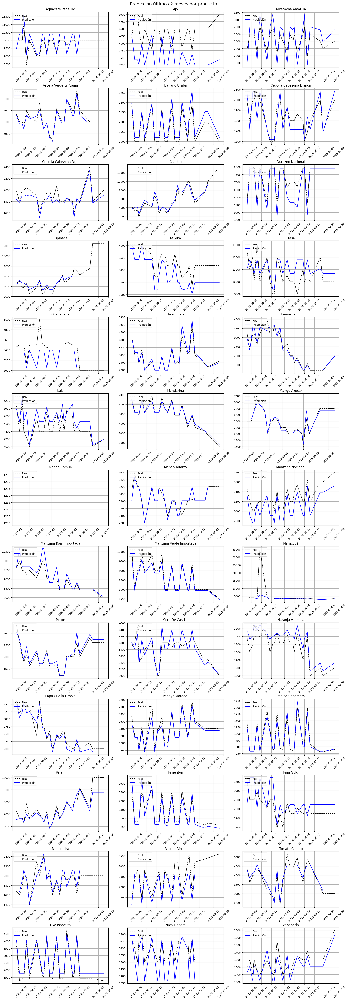

In [14]:
# ---------- GRAFICAR ----------

n = len(graficas)
cols = 3
rows = (n + cols - 1) // cols  # Calcular número de filas necesarias

fig, axes = plt.subplots(rows, cols, figsize=(cols * 6, rows * 4), constrained_layout=True)
axes = axes.flatten()  # Aplanar matriz de ejes

for i, graf in enumerate(graficas):
    ax = axes[i]
    
    ax.plot(graf['ds'], graf['real'], label='Real', color='black', linestyle='--')
    ax.plot(graf['ds'], graf['pred'], label='Predicción', color='blue')
    
    ax.set_title(graf['producto'])
    ax.tick_params(axis='x', rotation=45)
    ax.grid(True)
    ax.legend(loc='upper left')

# Eliminar subplots vacíos si hay menos productos que subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

fig.suptitle('Predicción últimos 2 meses por producto', fontsize=16)
plt.show()


## Entrenamiento del Modelo con todos los datos 

In [24]:
from prophet import Prophet
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

productos = df_completo['Producto'].unique()
graficas_futuras = []

for producto in productos:
    try:
        # Filtrar y preparar datos
        df_producto = df_completo[df_completo['Producto'] == producto].copy()
        df_producto = df_producto.rename(columns={'Fecha': 'ds', 'Precio_Sogamoso': 'y'})

        columnas = ['ds', 'y', 'Precio_Duitama', 'Precio_Tunja', 'Precio_Bogotá', 'Promedio_Mercados']
        if not all(col in df_producto.columns for col in columnas):
            continue

        df_producto = df_producto[columnas].dropna()

        # Eliminar precios <= 0 para aplicar log
        df_producto = df_producto[df_producto['y'] > 0]
        if len(df_producto) < 30:
            continue

        df_producto = df_producto.sort_values('ds').reset_index(drop=True)

        # Aplicar transformación logarítmica
        df_producto['y'] = np.log(df_producto['y'])

        # Crear modelo Prophet
        model = Prophet(
            changepoint_prior_scale=0.5,
            n_changepoints=40,
            yearly_seasonality=False,
            weekly_seasonality=True,
            daily_seasonality=False
        )

        # Agregar regresores
        model.add_regressor('Precio_Duitama')
        model.add_regressor('Precio_Tunja')
        model.add_regressor('Precio_Bogotá')
        model.add_regressor('Promedio_Mercados')

        # Entrenar modelo
        model.fit(df_producto)

        # Generar fechas futuras
        last_date = df_producto['ds'].max()
        future_dates = pd.date_range(start=last_date + pd.Timedelta(days=1), periods=30)

        # Repetir últimos valores de regresores
        ultimos_valores = df_producto[columnas[2:]].iloc[-1:]
        future_regresores = pd.concat([ultimos_valores] * len(future_dates), ignore_index=True)
        future_regresores['ds'] = future_dates

        future = future_regresores[['ds', 'Precio_Duitama', 'Precio_Tunja', 'Precio_Bogotá', 'Promedio_Mercados']]

        # Predecir
        forecast = model.predict(future)

        # Reconvertir predicciones del logaritmo
        forecast['yhat'] = np.exp(forecast['yhat'])
        forecast['yhat_lower'] = np.exp(forecast['yhat_lower'])
        forecast['yhat_upper'] = np.exp(forecast['yhat_upper'])

        # Extraer último mes real (sin transformación)
        ultimo_mes_real = df_completo[
            (df_completo['Producto'] == producto) &
            (df_completo['Fecha'] > df_producto['ds'].max() - pd.Timedelta(days=30))
        ].copy()
        ultimo_mes_real = ultimo_mes_real[ultimo_mes_real['Precio_Sogamoso'] > 0]  # evitar log(0)

        graficas_futuras.append({
            'producto': producto,
            'ds_real': ultimo_mes_real['Fecha'],
            'real': ultimo_mes_real['Precio_Sogamoso'],
            'ds_pred': forecast['ds'],
            'pred': forecast['yhat'],
            'lower': forecast['yhat_lower'],
            'upper': forecast['yhat_upper']
        })

    except Exception as e:
        print(f"Error con producto {producto}: {e}")


18:23:33 - cmdstanpy - INFO - Chain [1] start processing
18:23:36 - cmdstanpy - INFO - Chain [1] done processing
18:23:37 - cmdstanpy - INFO - Chain [1] start processing
18:23:39 - cmdstanpy - INFO - Chain [1] done processing
18:23:39 - cmdstanpy - INFO - Chain [1] start processing
18:23:42 - cmdstanpy - INFO - Chain [1] done processing
18:23:43 - cmdstanpy - INFO - Chain [1] start processing
18:23:45 - cmdstanpy - INFO - Chain [1] done processing
18:23:45 - cmdstanpy - INFO - Chain [1] start processing
18:23:48 - cmdstanpy - INFO - Chain [1] done processing
18:23:48 - cmdstanpy - INFO - Chain [1] start processing
18:23:51 - cmdstanpy - INFO - Chain [1] done processing
18:23:51 - cmdstanpy - INFO - Chain [1] start processing
18:23:52 - cmdstanpy - INFO - Chain [1] done processing
18:23:52 - cmdstanpy - INFO - Chain [1] start processing
18:23:54 - cmdstanpy - INFO - Chain [1] done processing
18:23:54 - cmdstanpy - INFO - Chain [1] start processing
18:23:55 - cmdstanpy - INFO - Chain [1]

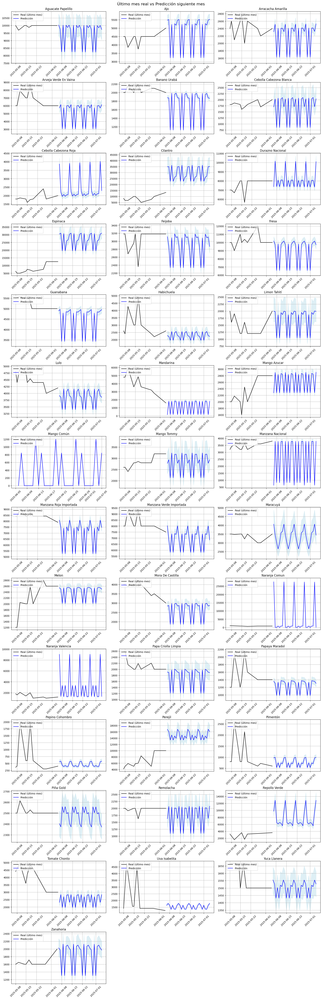

In [25]:
# ----------- GRAFICAR REAL VS PREDICCIÓN -----------
import matplotlib.pyplot as plt

n = len(graficas_futuras)
cols = 3
rows = (n + cols - 1) // cols  # Redondeo hacia arriba

fig, axes = plt.subplots(rows, cols, figsize=(cols * 6, rows * 4), constrained_layout=True)
axes = axes.flatten()  # Para acceso sencillo por índice

for i, graf in enumerate(graficas_futuras):
    ax = axes[i]

    # Línea real del último mes
    ax.plot(graf['ds_real'], graf['real'], label='Real (último mes)', color='black')

    # Predicción del mes siguiente
    ax.plot(graf['ds_pred'], graf['pred'], label='Predicción', color='blue')
    ax.fill_between(graf['ds_pred'], graf['lower'], graf['upper'], color='lightblue', alpha=0.4)

    # Estética
    ax.set_title(graf['producto'])
    ax.tick_params(axis='x', rotation=45)
    ax.grid(True)
    ax.legend(loc='upper left')

# Eliminar subplots vacíos si sobran
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

# Título general
fig.suptitle('Último mes real vs Predicción siguiente mes', fontsize=16)
plt.show()


## Generar variables de cambio por dia

In [26]:
df_predicciones = pd.DataFrame()

for g in graficas_futuras:
    temp = pd.DataFrame({
        'Producto': g['producto'],
        'Fecha': g['ds_pred'],
        'Prediccion': g['pred'],
        'Limite_inferior': g['lower'],
        'Limite_superior': g['upper']
    })
    df_predicciones = pd.concat([df_predicciones, temp], ignore_index=True)

# Visualizar
print(df_predicciones.head())


             Producto      Fecha    Prediccion  Limite_inferior  \
0  Aguacate Papelillo 2025-06-06  10031.516994      9323.347206   
1  Aguacate Papelillo 2025-06-07   9763.854784      9101.611902   
2  Aguacate Papelillo 2025-06-08   8246.905517      7663.318293   
3  Aguacate Papelillo 2025-06-09  10019.263821      9278.780574   
4  Aguacate Papelillo 2025-06-10   8245.143351      7698.241341   

   Limite_superior  
0     10769.485412  
1     10502.183027  
2      8880.111861  
3     10760.483987  
4      8844.930569  


In [27]:
# Ordenar por producto y fecha para asegurar el cálculo correcto
df_predicciones = df_predicciones.sort_values(['Producto', 'Fecha']).reset_index(drop=True)

# Calcular diferencia de la predicción entre fechas por producto
df_predicciones['cambio'] = df_predicciones.groupby('Producto')['Prediccion'].diff()

# Clasificar el cambio
df_predicciones['movimiento'] = df_predicciones['cambio'].apply(
    lambda x: 'subió' if x > 0 else ('bajó' if x < 0 else ('se mantuvo' if x == 0 else 'sin datos'))
)

# Mostrar las primeras filas del DataFrame con la nueva columna
print(df_predicciones[['Producto', 'Fecha', 'Prediccion', 'cambio', 'movimiento']].head(20))


              Producto      Fecha    Prediccion       cambio movimiento
0   Aguacate Papelillo 2025-06-06  10031.516994          NaN  sin datos
1   Aguacate Papelillo 2025-06-07   9763.854784  -267.662211       bajó
2   Aguacate Papelillo 2025-06-08   8246.905517 -1516.949267       bajó
3   Aguacate Papelillo 2025-06-09  10019.263821  1772.358304      subió
4   Aguacate Papelillo 2025-06-10   8245.143351 -1774.120470       bajó
5   Aguacate Papelillo 2025-06-11  10018.406868  1773.263517      subió
6   Aguacate Papelillo 2025-06-12   9867.539045  -150.867823       bajó
7   Aguacate Papelillo 2025-06-13  10024.014862   156.475817      subió
8   Aguacate Papelillo 2025-06-14   9756.552825  -267.462038       bajó
9   Aguacate Papelillo 2025-06-15   8240.738018 -1515.814807       bajó
10  Aguacate Papelillo 2025-06-16  10011.770852  1771.032835      subió
11  Aguacate Papelillo 2025-06-17   8238.977169 -1772.793683       bajó
12  Aguacate Papelillo 2025-06-18  10010.914540  1771.937371    

In [28]:
df_predicciones['Producto'].value_counts()

Producto
Aguacate Papelillo         30
Ajo                        30
Arracacha Amarilla         30
Arveja Verde En Vaina      30
Banano Urabá               30
Cebolla Cabezona Blanca    30
Cebolla Cabezona Roja      30
Cilantro                   30
Durazno Nacional           30
Espinaca                   30
Feijoba                    30
Fresa                      30
Guanabana                  30
Habichuela                 30
Limon Tahití               30
Lulo                       30
Mandarina                  30
Mango Azucar               30
Mango Común                30
Mango Tommy                30
Manzana Nacional           30
Manzana Roja Importada     30
Manzana Verde Importada    30
Maracuyá                   30
Melon                      30
Mora De Castilla           30
Naranja Comun              30
Naranja Valencia           30
Papa Criolla Limpia        30
Papaya Maradol             30
Pepino Cohombro            30
Perejil                    30
Pimentón                   30
P

In [29]:
df_predicciones.to_csv('../Data/outputs/df_Predicciones_completo_con_cambios.csv', index=False)

### Dataframe Original

In [30]:
df_completo.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30073 entries, 0 to 30072
Data columns (total 9 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   Fecha              30073 non-null  datetime64[ns]
 1   Producto           30073 non-null  object        
 2   Precio_Sogamoso    30073 non-null  float64       
 3   Precio_Tunja       30073 non-null  float64       
 4   Precio_Duitama     30073 non-null  float64       
 5   Precio_Bogotá      30073 non-null  float64       
 6   Promedio_Mercados  30073 non-null  float64       
 7   cambio             30015 non-null  float64       
 8   movimiento         30073 non-null  object        
dtypes: datetime64[ns](1), float64(6), object(2)
memory usage: 2.1+ MB


In [31]:
# Asegúrate de que esté ordenado por producto y fecha
df_completo = df_completo.sort_values(['Producto', 'Fecha']).reset_index(drop=True)

# Calcular el cambio del precio de Sogamoso por producto
df_completo['cambio'] = df_completo.groupby('Producto')['Precio_Sogamoso'].diff()

# Clasificar el movimiento: subió, bajó o se mantuvo
df_completo['movimiento'] = df_completo['cambio'].apply(
    lambda x: 'subió' if x > 0 else ('bajó' if x < 0 else ('se mantuvo' if x == 0 else 'sin datos'))
)


In [33]:
df_completo.head()
# Exportar datos
df_completo.to_csv('../Data/outputs/df_completo_con_cambios.csv', index=False)